<a href="https://colab.research.google.com/github/sanu1230/Academic-Project/blob/master/Stacked_Model_Airquality_Italian_City.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stacked Model - Airquality Italian City



#Project AirQuality

##Air quality of an Italian city

- The dataset contains 9358 instances of hourly averaged responses from an array of 5 metal oxide chemical sensors embedded in an 'Air Quality Chemical Multisensor Device'. 
- The device was located on the field in a significantly polluted area, at road level, within an Italian city. 
- Data were recorded from March 2004 to February 2005 (one year) representing the longest freely available recordings of on field deployed air quality chemical sensor devices responses. 
- Ground Truth hourly averaged concentrations for CO, Non Metanic Hydrocarbons, Benzene, Total Nitrogen Oxides (NOx) and Nitrogen Dioxide (NO2) and were provided by a co-located reference certified analyzer. 

Missing values are tagged with -200 value. 


##Attributes of the dataset are:

0.	 Date (DD/MM/YYYY) 
1.	Time (HH.MM.SS)
2.	True hourly averaged concentration CO in mg/m^3 (reference analyzer)
3.	PT08.S1 (tin oxide) hourly averaged sensor response (nominally CO targeted)
4.	True hourly averaged overall Non Metanic HydroCarbons concentration in microg/m^3 (reference analyzer)
5.	True hourly averaged Benzene concentration in microg/m^3 (reference analyzer) 
6.	PT08.S2 (titania) hourly averaged sensor response (nominally NMHC targeted) 
7.	True hourly averaged NOx concentration in ppb (reference analyzer) 
8.	PT08.S3 (tungsten oxide) hourly averaged sensor response (nominally NOx targeted) 
9.	True hourly averaged NO2 concentration in microg/m^3 (reference analyzer) 

10.	PT08.S4 (tungsten oxide) hourly averaged sensor response (nominally NO2 targeted) 
11.	 PT08.S5 (indium oxide) hourly averaged sensor response (nominally O3 targeted) 
12.	 Temperature in °C 
13.	 Relative Humidity (%) 
14.	 AH Absolute Humidity


##Business Problem: 
- To predict the Relative Humidity at a given point of time based on all other attributes affecting the change in RH.

#Loading Data

In [ ]:
!pip -q install pandas_profiling==2.5.0

     |████████████████████████████████| 194kB 2.7MB/s 
     |████████████████████████████████| 10.4MB 7.3MB/s 
     |████████████████████████████████| 133kB 39.5MB/s 
     |████████████████████████████████| 614kB 39.7MB/s 
     |████████████████████████████████| 1.5MB 39.4MB/s 
     |████████████████████████████████| 61kB 6.9MB/s 
     |████████████████████████████████| 61kB 7.0MB/s 
     |████████████████████████████████| 256kB 43.1MB/s 
     |████████████████████████████████| 61kB 5.8MB/s 
     |████████████████████████████████| 327kB 36.4MB/s 
     |████████████████████████████████| 215kB 40.8MB/s 
     |████████████████████████████████| 51kB 4.8MB/s 
     |████████████████████████████████| 747kB 40.0MB/s 
     |████████████████████████████████| 61kB 5.6MB/s 
ERROR: google-colab 1.0.0 has requirement pandas~=1.0.0; python_version >= "3.0", but you'll have pandas 0.25.3 which is incompatible.
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.22.0 

In [ ]:
!pip freeze | grep pandas

pandas==0.25.3
pandas-datareader==0.8.1
pandas-gbq==0.11.0
pandas-profiling==2.5.0
sklearn-pandas==1.8.0


##Importing Libraries

In [ ]:
#Importing Important Libriaries
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import time
import pandas_profiling
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import dask.dataframe as dd

In [ ]:
# Installing Interpreter packages

!pip -q install imgaug==0.2.5
!pip -q install lime
!pip -q install shap
!pip -q install eli5

     |████████████████████████████████| 563kB 2.8MB/s 
     |████████████████████████████████| 276kB 2.8MB/s 
     |████████████████████████████████| 2.0MB 7.5MB/s 
     |████████████████████████████████| 276kB 2.7MB/s 
     |████████████████████████████████| 112kB 2.8MB/s 


In [ ]:
#Loading data from google.drive

from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


##Reading Data with Pandas

In [ ]:
%time

start_time = time.time()
df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Project_datasets_modified_v2/Airquality/Airquality/AirQualityUCI.csv')
stop_time = time.time()
print("Pandas has taken {}'sec to read the csv file".format(start_time - stop_time))
df.head()

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 5.48 µs
Pandas has taken -2.4255826473236084'sec to read the csv file


,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,3/10/2004,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN
1,3/10/2004,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN
2,3/10/2004,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN
3,3/10/2004,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN
4,3/10/2004,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN


##Reading Data with Dask

In [ ]:
%time

start_time = time.time()
dff = dd.read_csv('/content/drive/My Drive/Colab Notebooks/Project_datasets_modified_v2/Airquality/Airquality/AirQualityUCI.csv', dtype='object')
stop_time = time.time()
print("Dask has taken {}'sec to read the csv file".format(start_time - stop_time))
dff.head()

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.48 µs
Dask has taken -0.05238676071166992'sec to read the csv file


,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,3/10/2004,18:00:00,2.6,1360,150,11.9,1046,166,1056,113,1692,1268,13.6,48.9,0.7578,NaN,NaN
1,3/10/2004,19:00:00,2,1292,112,9.4,955,103,1174,92,1559,972,13.3,47.7,0.7255,NaN,NaN
2,3/10/2004,20:00:00,2.2,1402,88,9.0,939,131,1140,114,1555,1074,11.9,54.0,0.7502,NaN,NaN
3,3/10/2004,21:00:00,2.2,1376,80,9.2,948,172,1092,122,1584,1203,11.0,60.0,0.7867,NaN,NaN
4,3/10/2004,22:00:00,1.6,1272,51,6.5,836,131,1205,116,1490,1110,11.2,59.6,0.7888,NaN,NaN


In [ ]:
# Dask is faster and has read the csv file in 0.03seconds, which is better then pandas.
# However, we will work with pandas for now

#Exploratory Data Analysis

##Data Understanding

In [ ]:
df.shape

(9471, 17)

In [ ]:
df.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,0.0,0.0
mean,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604,NaN,NaN
std,77.657170,329.832710,139.789093,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670,NaN,NaN
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,NaN,NaN
25%,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300,NaN,NaN
50%,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.600000,0.976800,NaN,NaN
75%,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200,NaN,NaN
max,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
Date             9357 non-null object
Time             9357 non-null object
CO(GT)           9357 non-null float64
PT08.S1(CO)      9357 non-null float64
NMHC(GT)         9357 non-null float64
C6H6(GT)         9357 non-null float64
PT08.S2(NMHC)    9357 non-null float64
NOx(GT)          9357 non-null float64
PT08.S3(NOx)     9357 non-null float64
NO2(GT)          9357 non-null float64
PT08.S4(NO2)     9357 non-null float64
PT08.S5(O3)      9357 non-null float64
T                9357 non-null float64
RH               9357 non-null float64
AH               9357 non-null float64
Unnamed: 15      0 non-null float64
Unnamed: 16      0 non-null float64
dtypes: float64(15), object(2)
memory usage: 1.2+ MB


**Observation:**
- *Last two columns, 'Unnamed: 15' & 'Unnamed: 16' have no values at all hence, need to be deleted.*
- *There are 9471 total entries or rangeindex, but every features has 9357 entries only, which means they have equal missing values, which can be dropped.*

##Data Cleaning

In [ ]:
#Lets delete the unnamed columns whcih has absolute no data in it.
del df['Unnamed: 15']
del df['Unnamed: 16']
df.shape

(9471, 15)

In [ ]:
# Find empty/missing values
df.isnull().sum()

Date             114
Time             114
CO(GT)           114
PT08.S1(CO)      114
NMHC(GT)         114
C6H6(GT)         114
PT08.S2(NMHC)    114
NOx(GT)          114
PT08.S3(NOx)     114
NO2(GT)          114
PT08.S4(NO2)     114
PT08.S5(O3)      114
T                114
RH               114
AH               114
dtype: int64

**Observaion:** Since there is no data in the last 114 rows from all the columns, dropping them is the best decision

In [ ]:
#Dropping the empty rows
df = df.dropna(axis= 0, how='all')
df.shape

(9357, 15)

###Missing Values

In [ ]:
# As mentioned about the data, that all missing values are marked as -200
#So finding the mising values

col_names = df.columns

missing_value = (df[col_names]==-200).sum()
missing_value

Date                0
Time                0
CO(GT)           1683
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64

In [ ]:
#Lets replace all missing value marked -200 by NaN

df.replace(to_replace=-200, value=np.nan, inplace=True)

df.isnull().sum()

Date                0
Time                0
CO(GT)           1683
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64

In [ ]:
df1 = df.copy()

In [ ]:
#Lets replace the NaN values by its mean()

for col in df:
  if df[col].isnull().any():
    df[col] = df[col].fillna(df[col].mean())

df.isnull().sum()

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

##Data Profiling

In [ ]:
report = pandas_profiling.ProfileReport(df)

report.to_file('AirQuality.html')

In [ ]:
from IPython.display import display, HTML, IFrame
display(HTML(open('AirQuality.html').read()))

Number of variables,15
Number of observations,9357
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,2.2 MiB
Average record size in memory,242.5 B
NUM,13
CAT,2
Analysis started,2020-06-12 02:51:05.257812


**Observation:**
- *Features 'Data' and 'Time' needs to be converted from object to datetime.*
- Date has 391 and Time has 24 distinct values
- Many features have high kurtosis and skewness, needs to be normalised

##Data Visualization

###Lets look at some strong correlation with heatmap

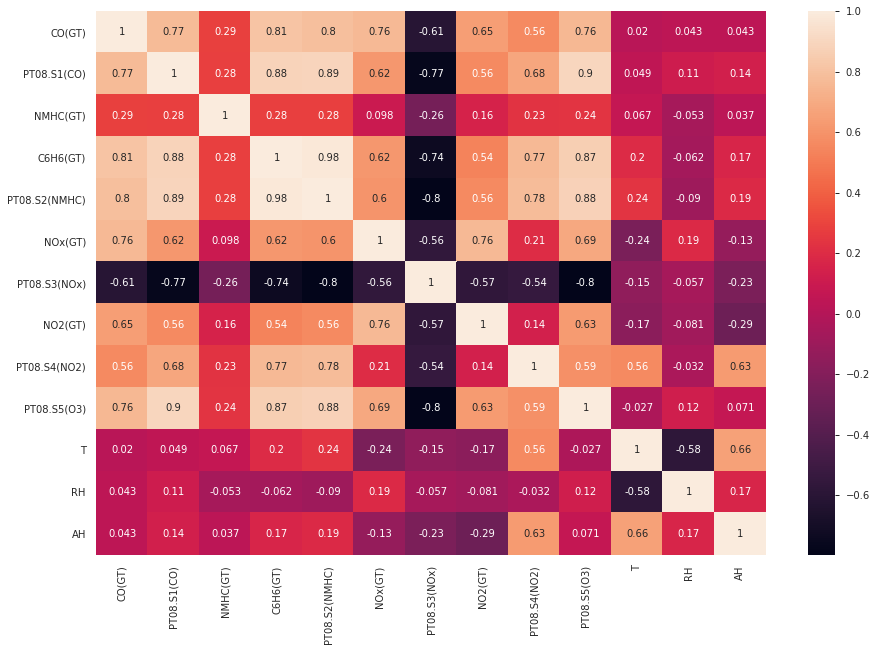

In [ ]:
#Lets build a heat map to see strong correlation

corr_matrix = df.corr()

plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True)

In [ ]:
# In this block of code we are going to check all the variables with correlation above a certain threshold

corr_threshold = 0.8  # This is a correlation threshold. We need to find variables with greater threshold

col1 = ['Date', 'Time', 'RH']

print('*-----------------------------Checking for Correlation-------------------------------*')
for c in col_names:
  for r in col_names:
    if (r < c):
      if (c not in col1) and (r not in col1):
        if abs(corr_matrix[r][c]) > corr_threshold:
          print(c +" : "+ r+" : "+ str(corr_matrix[r][c]))



*-----------------------------Checking for Correlation-------------------------------*
CO(GT) : C6H6(GT) : 0.8123611629338673
PT08.S1(CO) : C6H6(GT) : 0.883795076608062
PT08.S2(NMHC) : PT08.S1(CO) : 0.892964388707041
PT08.S2(NMHC) : C6H6(GT) : 0.9819503158012514
PT08.S5(O3) : PT08.S1(CO) : 0.8993235214436075
PT08.S5(O3) : C6H6(GT) : 0.8656885045054664
PT08.S5(O3) : PT08.S2(NMHC) : 0.880577748966784


###Correlation between 'PT08.S1(CO)' and 'C6H6(GT)' with Scattter plot.

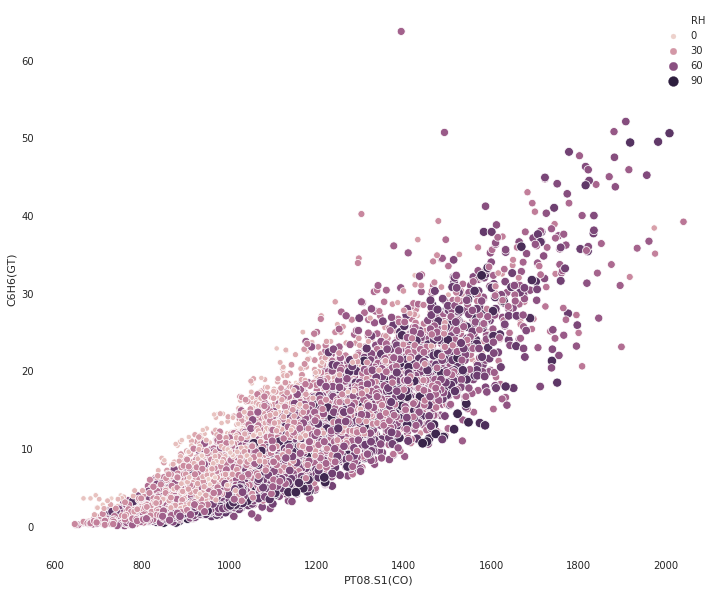

In [ ]:
# Lets do visualization of some highly correlated features

# Lets see the correlation between PT08.S1(CO) and C6H6(GT)

plt.figure(figsize=(12, 10))
sns.scatterplot(data=df, x='PT08.S1(CO)', y='C6H6(GT)', size='RH', hue='RH', hue_order=True)

**Observation:**
- Relative humidity increases As PT08.S1(CO) tin oxide increases, mainly could be seen between 1500 to 2000

###Lets see the insigths of relation between PT08.S1(CO) and C6H6(GT) with Mathplotlib pyplot scatter plot

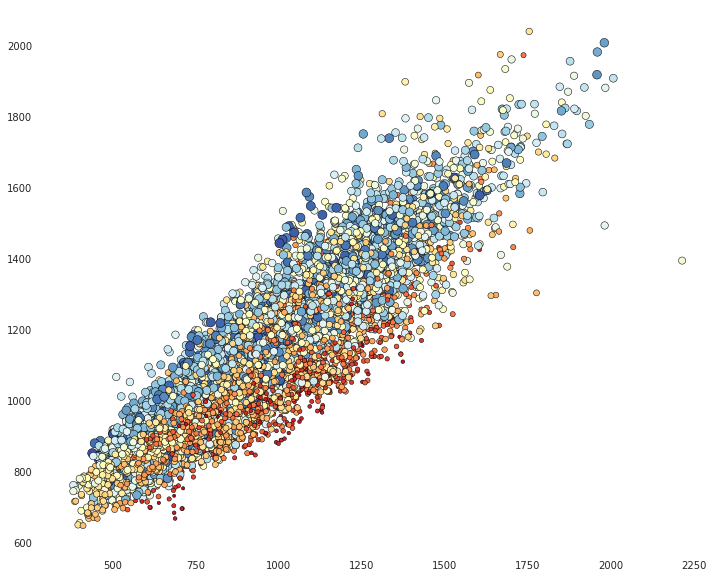

In [ ]:
# Lets see the correlation between PT08.S1(CO) and C6H6(GT)

plt.figure(figsize=(12, 10))
plt.scatter(x='PT08.S2(NMHC)', y='PT08.S1(CO)', s='RH', c='RH', cmap='RdYlBu', edgecolors='black', data=df, linewidth=0.5)
plt.show()

###Lets see correlation between PT08.S5(O3) & PT08.S2(NMHC) with Plotly Express scatter plot

In [ ]:
# Relation between PT08.S5(O3) & PT08.S2(NMHC)

plt.figure(figsize=(10, 8))
px.scatter(df, x='PT08.S5(O3)', y='PT08.S2(NMHC)', color='RH', trendline='ols', marginal_x='histogram', marginal_y='box')

<Figure size 720x576 with 0 Axes>

###Correlation between PT08.S1(CO) & C6H6(GT) with Seaborn boxplot.

In [ ]:
#Correlation between PT08.S1(CO) & C6H6(GT), with trendline and marginal graphs of x and y axis.

plt.figure(figsize=(10, 6))
px.scatter(df, x='PT08.S1(CO)', y='C6H6(GT)', color='RH', trendline='ols', marginal_x='box', marginal_y='violin')

<Figure size 720x432 with 0 Axes>

In [ ]:
df.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

###The correlation between PT08.S2(NMHC) & C6H6(GT)

In [ ]:
# Lets see the correlation between PT08.S2(NMHC) and C6H6(GT) with marginal graphs of x and y axis

fig = px.scatter(df, x='PT08.S2(NMHC)', y='C6H6(GT)', color='RH', marginal_x='histogram', marginal_y='box')
fig.show()

#Feature Engineering

In [ ]:
df2 = df.copy()

##Converting 'Date' & 'Time' col to datetime

In [ ]:
#Converting Date and Time column type Object to datetime with pandas

df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['Time'] = pd.to_datetime(df['Time'], errors='coerce')


In [ ]:
#Creating seprate columns of date and time

df['Year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day
df['time'] = df['Time'].dt.hour

In [ ]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9357 entries, 0 to 9356
Data columns (total 19 columns):
Date             9357 non-null datetime64[ns]
Time             9357 non-null datetime64[ns]
CO(GT)           9357 non-null float64
PT08.S1(CO)      9357 non-null float64
NMHC(GT)         9357 non-null float64
C6H6(GT)         9357 non-null float64
PT08.S2(NMHC)    9357 non-null float64
NOx(GT)          9357 non-null float64
PT08.S3(NOx)     9357 non-null float64
NO2(GT)          9357 non-null float64
PT08.S4(NO2)     9357 non-null float64
PT08.S5(O3)      9357 non-null float64
T                9357 non-null float64
RH               9357 non-null float64
AH               9357 non-null float64
Year             9357 non-null int64
month            9357 non-null int64
day              9357 non-null int64
time             9357 non-null int64
dtypes: datetime64[ns](2), float64(13), int64(4)
memory usage: 1.4 MB


## Label Encoding the Target

In [ ]:
# from sklearn.preprocessing import LabelEncoder

# le = LabelEncoder()
# df['RH'] = le.fit_transform(df['RH'])

In [ ]:
df['RH'] = df['RH'].astype(int)

##Data Sampling

In [ ]:
df_samp = df.sample(n=1000, random_state=11)
df_samp.shape

(1000, 19)

#Data Splitting and Standardization

In [ ]:
#Lets drop features which are highly correlated and unimportant to some other features

X = df_samp.drop(['RH', 'Date', 'Time'], axis=1)
y= df_samp['RH']

#Lets Use Sandardscaler to normalise the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)

# Scale and center the data
X_normalized = scaler.transform(X)

# Create a pandas DataFrame
X = pd.DataFrame(data=X_normalized, index=X.index, columns=X.columns)


In [ ]:
X.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,AH,Year,month,day,time
7388,0.728414,0.678641,0.00612,0.708350,0.822762,0.960190,-1.121189,0.955021,0.084101,0.949638,-0.310917,-0.421799,1.713770,-1.505746,-0.435488,0.383155
8959,-0.191137,0.438853,0.00612,-0.504156,-0.399612,0.162625,-0.732386,0.932284,-0.549160,0.361995,-0.713686,-0.196256,1.713770,-0.941056,0.360859,-1.531146
2425,-0.421025,0.005510,0.00612,0.003320,0.005903,-0.961460,0.004371,-0.841171,0.035929,-0.004567,0.059381,0.043365,-0.583509,-0.094021,0.360859,1.119424
8840,-1.417206,0.095628,0.00612,-0.655719,-0.603972,-0.319126,-0.502992,0.204713,-0.739138,0.181377,-0.909317,-0.431981,1.713770,-0.941056,-0.207960,-1.383892
6473,-0.650913,-0.609631,0.00612,-0.779726,-0.774272,-0.404770,0.259062,-0.954854,-0.727625,-0.563988,-0.552578,0.001285,-0.583509,1.600049,-1.231836,-0.058607


In [ ]:
X.shape

(1000, 16)

#Feature Importance

##Important Features

[0.05926727 0.07019532 0.01148782 0.06712871 0.06858826 0.06338514
 0.07028185 0.0648161  0.07173153 0.07007277 0.09302702 0.08860432
 0.00882376 0.0535208  0.06960404 0.06946527]


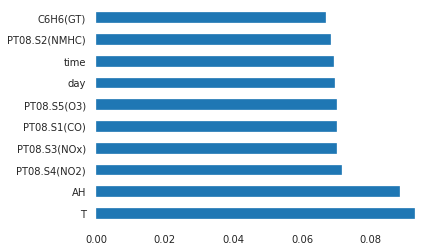

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier()
model.fit(X,y)

print(model.feature_importances_) #using inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [ ]:
X.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'AH', 'Year', 'month', 'day', 'time'],
      dtype='object')

In [ ]:
X = X.drop(['CO(GT)', 'NMHC(GT)', 'NOx(GT)', 'NO2(GT)', 'Year', 'month'], axis=1) #Dropping fatures which are not important

##Splitting Data into train and test

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=11)

#Model Building

In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import explained_variance_score
from sklearn.metrics import r2_score


def model_train(model, name):
    model.fit(X_train, y_train)                                          # Fitting the model
    y_pred = model.predict(X_test)   
    print('')                                    # Making prediction from the trained model
    mse = mean_squared_error(y_test, y_pred)                         
    print(name + ' RMSE: {}'.format(np.sqrt(mse)))                # Displaying RMSE
    print('')
    mae = mean_absolute_error(y_test, y_pred)
    print(name +" MAE: {}".format(mae))           # Displaying MAE
    print('')
    evs = explained_variance_score(y_test, y_pred)
    print(name +" Explained Variance Score: {}".format(evs))
    print('') 
    r2 = r2_score(y_test, y_pred)
    print(name + ' r2_score: {}'.format(r2))
    print('')
    bias = y_pred - y_test.mean()
    print(name + " Bias: " + str(bias.mean()))                                                 # Calculating bias
    print('')
    var = np.var([y_test, y_pred], axis=0)
    print(name + " Variance: " + str(var.mean()))                                             # Calculate Variance
    print('')
    return mse, mae, r2, model



##Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

lr_mse, lr_mae, lr_r2, lr_model = model_train(lr, 'Linear Regression')


Linear Regression RMSE: 6.010644671253572

Linear Regression MAE: 4.610837651713016

Linear Regression Explained Variance Score: 0.8712751089805965

Linear Regression r2_score: 0.871221729967525

Linear Regression Bias: -0.12237283779336082

Linear Regression Variance: 9.03196234101724



##Decision Tree



In [ ]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(criterion = 'mse', max_depth = 10, min_samples_leaf =3, random_state=10)

In [ ]:
dt_mse, dt_mae, dt_r2, dt_model = model_train(dt, 'Decision Tree')


Decision Tree RMSE: 4.026564283190248

Decision Tree MAE: 2.869041326728827

Decision Tree Explained Variance Score: 0.942277588430771

Decision Tree r2_score: 0.9422077303087878

Decision Tree Bias: 0.13999361055611084

Decision Tree Variance: 4.053304981665848



##Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf_clf = RandomForestRegressor(n_estimators=50, random_state=102)


In [ ]:
rf_mse, rf_mae, rf_r2, rf_model = model_train(rf_clf, 'Random Forest Regressor') 


Random Forest Regressor RMSE: 2.499842395032135

Random Forest Regressor MAE: 1.779266666666667

Random Forest Regressor Explained Variance Score: 0.9777280140204266

Random Forest Regressor r2_score: 0.9777245885212708

Random Forest Regressor Bias: 0.031000000000000725

Random Forest Regressor Variance: 1.5623030000000002



##Grid SearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV

random_grid = {'n_estimators': range(1, 50, 2),
               'max_features': ['auto', 'sqrt'],
               'max_depth': [10, 20, 30, 40],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4]
               }
rf = RandomForestRegressor()

rf_gs = GridSearchCV(rf, random_grid, cv=4, n_jobs= -1, verbose=2)
rf_gs.fit(X_train, y_train)
y_pred = rf_gs.predict(X_test)


Fitting 4 folds for each of 1800 candidates, totalling 7200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 296 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done 702 tasks      | elapsed:   50.4s
[Parallel(n_jobs=-1)]: Done 1508 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 2968 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 4748 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 6856 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 7200 out of 7200 | elapsed:  6.9min finished


In [ ]:
rf_gs.best_estimator_

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=30, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=41, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
Gs = rf_gs.best_estimator_
print('Grid SearchCV')
Gs_mse, Gs_mae, Gs_r2, Gs_model = model_train(Gs, 'Grid SearchCV')

Grid SearchCV

Grid SearchCV RMSE: 2.5305556852488253

Grid SearchCV MAE: 1.836422764227642

Grid SearchCV Explained Variance Score: 0.9772082520884134

Grid SearchCV r2_score: 0.9771738706436203

Grid SearchCV Bias: -0.09821138211382063

Grid SearchCV Variance: 1.6009280190362878



##Random Grid Search

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

rf = RandomForestRegressor()

rf_random = RandomizedSearchCV(rf, random_grid, cv = 3, n_jobs=-1, random_state=12, verbose=2)


In [ ]:
rfrn_mse, rfrn_mae, rfrn_r2, rfrn_model = model_train(rf_random, 'Random Grid Search')

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:    3.1s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    3.2s finished



Random Grid Search RMSE: 2.6577116739018156

Random Grid Search MAE: 1.9076801103819996

Random Grid Search Explained Variance Score: 0.9748374438581557

Random Grid Search r2_score: 0.9748222912607608

Random Grid Search Bias: -0.0651993556164336

Random Grid Search Variance: 1.7658578353984975



##Support Vector Machine(SVM)

In [ ]:
from sklearn.svm import SVR
svm = SVR(kernel='linear')

model_train(svm, 'SVR')


SVR RMSE: 6.143059207578719

SVR MAE: 4.572914187073851

SVR Explained Variance Score: 0.8658602180048014

SVR r2_score: 0.8654852591054615

SVR Bias: -0.3243333398350812

SVR Variance: 9.43429410695442



(37.73717642781768,
 4.572914187073851,
 0.8654852591054615,
 SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
     kernel='linear', max_iter=-1, shrinking=True, tol=0.001, verbose=False))

#Stacked Model

##Creating definations to genralize the stacked model

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor

# getting a stacking ensemble of models
def get_stacking():
	# define the base models
  level0 = list()
  level0.append(('lr', LinearRegression()))
  level0.append(('knn', KNeighborsRegressor()))
  level0.append(('dt', DecisionTreeRegressor()))
  level0.append(('rf', RandomForestRegressor()))
  level0.append(('svm', SVR(kernel='linear')))
  # level0.append(('grid', GridSearchCV(rf, random_grid, cv=4, n_jobs= -1, verbose=2)))
  # level0.append(('Rd_grid', RandomizedSearchCV(rf, random_grid, cv = 3, n_jobs=-1, random_state=12, verbose=2)))


  # defining meta learner model
  level1 = LinearRegression()

  # defining the stacking ensemble
  model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5)
  return model

# Making a list of models to evaluate
def get_models():
  models = dict()
  models['lr'] = LinearRegression()
  models['knn'] = KNeighborsRegressor()
  models['dt'] = DecisionTreeRegressor()
  models['rf'] = RandomForestRegressor()
  models['svm'] = SVR(kernel='linear')
  # models['grid'] = GridSearchCV(rf, random_grid, cv=4, n_jobs= -1, verbose=2)
  # models['Rd_grid'] = RandomizedSearchCV(rf, random_grid, cv = 3, n_jobs=-1, random_state=12, verbose=2)
  models['Stacking'] = get_stacking()
  return models

# evaluate the model using cross-validation
def evaluate_model(model):
  cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=111)
  scores = cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1, error_score='raise')
  return scores

##Evaluating all Models

In [ ]:
# getting the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
  scores = evaluate_model(model)
  results.append(scores)
  names.append(name)
  print('>%s %.3f (%.3f)' % (name, np.mean(scores), np.std(scores)))

>lr 0.870 (0.014)
>knn 0.771 (0.027)
>dt 0.960 (0.011)
>rf 0.986 (0.004)
>svm 0.867 (0.017)
>Stacking 0.988 (0.003)


**Observation:** 
- Running the above Stacked Regerssor Model, first reports the performance of all base level models and then stacking ensemble models
- In the above case we see that Decision Tree, Random Forest and Stacked Model perform better then other models

##Compairing all Models

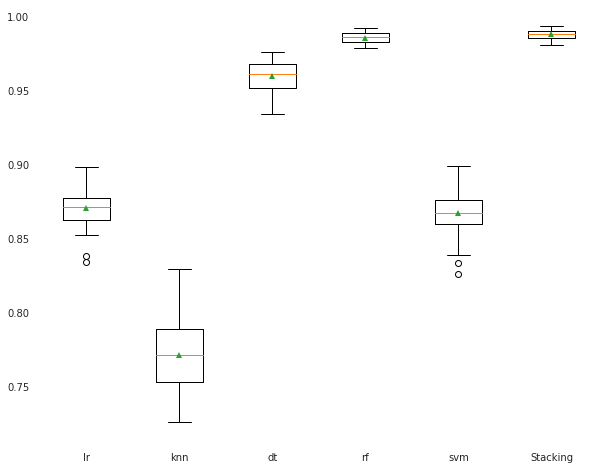

In [ ]:
# plot model performance for comparison
plt.figure(figsize=(10,8))
plt.boxplot(results, labels=names, showmeans=True)
plt.show()

#Model Explaination

##ELI5

Permutation Importance


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance
stacking = get_stacking()
stacking_model = stacking.fit(X_train, y_train)

# Find the importance of columns for prediction
perm = PermutationImportance(stacking_model, random_state=101).fit(X_test, y_test)      # Evaluate the permutation importance 
eli5.show_weights(perm, feature_names = X_test.columns.values)                    # Display the weights of each features


Using TensorFlow backend.


Weight,Feature
2.8119 ± 0.2174,T
1.7417 ± 0.0964,AH
0.0214 ± 0.0030,C6H6(GT)
0.0098 ± 0.0023,PT08.S2(NMHC)
0.0033 ± 0.0016,PT08.S4(NO2)
0.0011 ± 0.0002,PT08.S5(O3)
0.0008 ± 0.0015,PT08.S1(CO)
0.0003 ± 0.0003,day
0.0002 ± 0.0005,PT08.S3(NOx)
-0.0002 ± 0.0005,time


**Conlusion:** The columns in green are the most important features

In [ ]:
#Understanding how each feature influences the prediction

ind = 50
eli5.show_prediction(stacking_model, doc=X_test.iloc[[ind]], feature_names=list(X_test.columns))

##SHAP


In [ ]:
#Import SHAP package
import shap

model_fit = lr.fit(X_train, y_train)

#Create explainer for linear model
explainer = shap.LinearExplainer(model_fit, data=X_test.values)
shap_values = explainer.shap_values(X_test)

In [ ]:
#Understanding how each feature influences the prediction

shap.initjs()
ind = 50


shap.force_plot(
    explainer.expected_value, shap_values[ind,:], X_test.iloc[ind,:],
    feature_names=X_test.columns.tolist()
)

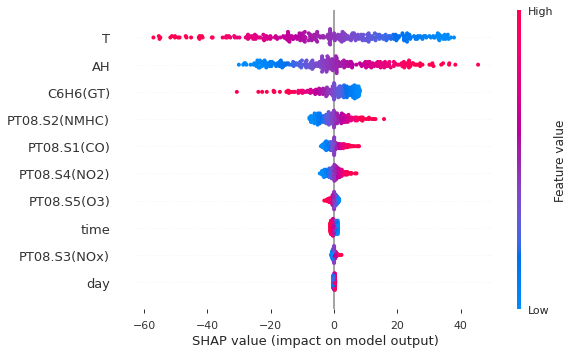

In [ ]:
shap.summary_plot(shap_values,X_test)


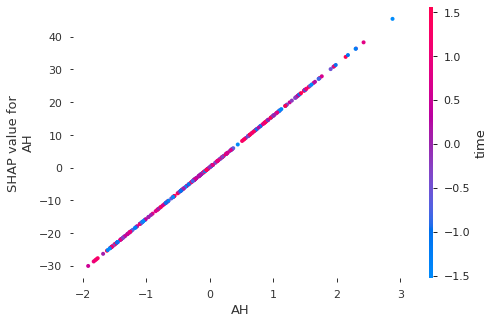

In [ ]:
shap.dependence_plot("AH", shap_values, X_test)

##LIME

In [ ]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(X_test.values[:,x])) for x in range(X_test.values.shape[1])]) <= 10).flatten()

#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,
feature_names=X_test.columns.values.tolist(),
class_names=['RH'],
categorical_features=categorical_features,
verbose=True, mode='regression')
ind = 50

#Fit on test data
exp = explainer.explain_instance(X_test.values[ind], model_fit.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 44.8945462543089
Prediction_local [59.81491906]
Right: 54.60546567041216
